In [1]:
# Verify Kaggle has assigned a GPU runtime (Notebook options > Accelerator > GPU T4 x2)
!nvidia-smi

Tue Sep 15 14:24:57 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.159.04             Driver Version: 580.159.04     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   56C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# Clear any pre-existing pip cache and stale package state before we start
!rm -rf /root/.cache/pip
!pip list --format=freeze > /kaggle/working/before_packages.txt

In [3]:
!wget -q https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh -O /kaggle/working/miniconda.sh
!bash /kaggle/working/miniconda.sh -b -p /kaggle/working/miniconda

# Anaconda now requires explicit ToS acceptance for these channels before non-interactive use
!/kaggle/working/miniconda/bin/conda tos accept --override-channels --channel https://repo.anaconda.com/pkgs/main
!/kaggle/working/miniconda/bin/conda tos accept --override-channels --channel https://repo.anaconda.com/pkgs/r

!/kaggle/working/miniconda/bin/conda create -y -n geochat python=3.10

PREFIX=/kaggle/working/miniconda
Unpacking bootstrapper...
Unpacking payload...

Installing base environment...

Preparing transaction: ...working... done
Executing transaction: ...working... done
installation finished.
    You currently have a PYTHONPATH environment variable set. This may cause
    unexpected behavior when running the Python interpreter in Miniconda3.
    For best results, please verify that your PYTHONPATH only points to
    directories of packages that are compatible with the Python interpreter
    in Miniconda3: /kaggle/working/miniconda
accepted Terms of Service for https://repo.anaconda.com/pkgs/main
accepted Terms of Service for https://repo.anaconda.com/pkgs/r
Jupyter detected...
2 channel Terms of Service accepted
Retrieving notices: done
Channels:
 - defaults
Platform: linux-64
Solving environment: done


==> WARNING: A newer version of conda exists. <==
    current version: 26.7.1
    latest version: 26.7.2

Please update conda by running

    $ conda self u

In [4]:
!/kaggle/working/miniconda/bin/conda tos accept --override-channels --channel https://repo.anaconda.com/pkgs/main
!/kaggle/working/miniconda/bin/conda tos accept --override-channels --channel https://repo.anaconda.com/pkgs/r
!/kaggle/working/miniconda/bin/conda create -y -n geochat python=3.10

accepted Terms of Service for https://repo.anaconda.com/pkgs/main
accepted Terms of Service for https://repo.anaconda.com/pkgs/r
Jupyter detected...
2 channel Terms of Service accepted
Channels:
 - defaults
Platform: linux-64
Solving environment: done


==> WARNING: A newer version of conda exists. <==
    current version: 26.7.1
    latest version: 26.7.2

Please update conda by running

    $ conda self update



## Package Plan ##

  environment location: /kaggle/working/miniconda/envs/geochat

  added / updated specs:
    - python=3.10


The following NEW packages will be INSTALLED:

  _libgcc_mutex      pkgs/main/linux-64::_libgcc_mutex-0.1-main 
  _openmp_mutex      pkgs/main/linux-64::_openmp_mutex-5.1-52_gnu 
  bzip2              pkgs/main/linux-64::bzip2-1.0.8-h5eee18b_6 
  ca-certificates    pkgs/main/linux-64::ca-certificates-2026.8.13-h06a4308_0 
  ld_impl_linux-64   pkgs/main/linux-64::ld_impl_linux-64-2.44-h9e0c5a2_3 
  libexpat           pkgs/main/linux-64::libexpat-2.8.

In [5]:
!ls /kaggle/working/miniconda/envs/geochat/bin/ | grep -E "^(pip|python)$"

pip
python


In [6]:
ENV_PIP = "/kaggle/working/miniconda/envs/geochat/bin/pip"

# Install torch first
!{ENV_PIP} install torch==2.0.1+cu117 torchvision==0.15.2+cu117 \
    --index-url https://download.pytorch.org/whl/cu117

!{ENV_PIP} install transformers==4.31.0

# Use an older bitsandbytes that doesn't force torch>=2.4
!{ENV_PIP} install bitsandbytes==0.41.1 accelerate==0.21.0 sentencepiece

# Reinstall torch again in case accelerate/bitsandbytes touched it — this must be the LAST torch install
!{ENV_PIP} install torch==2.0.1+cu117 torchvision==0.15.2+cu117 \
    --index-url https://download.pytorch.org/whl/cu117 --force-reinstall --no-deps

!{ENV_PIP} install timm==0.6.13 --no-deps

Looking in indexes: https://download.pytorch.org/whl/cu117
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 GB 11.2 MB/s  0:00:306m0:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 116.8 MB/s  0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 MB 121.0 MB/s  0:00:000:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 149.5 MB/s  0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 141.5 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 82.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 166.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 160.1 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 kB 20.6 MB/s  0:00:00
  Created wheel for lit: filename=lit-15.0.7-py3-none-any.whl size=90063 sha256=c35fd9578d

In [7]:
ENV_PIP = "/kaggle/working/miniconda/envs/geochat/bin/pip"

# Correct the two version mismatches first
!{ENV_PIP} install bitsandbytes==0.41.0 sentencepiece==0.1.99

# Install the rest of GeoChat's declared dependencies at their exact pins
!{ENV_PIP} install einops==0.6.1 einops-exts==0.0.4 fastapi uvicorn shortuuid \
    gradio==3.35.2 gradio_client==0.2.9 httpx==0.24.0 peft==0.4.0 \
    scikit-learn==1.2.2 wandb "markdown2[all]"

# deepspeed can be heavy/finicky to build — install separately so a failure here doesn't block the rest
!{ENV_PIP} install deepspeed==0.9.5

# Safety net: undo any torch upgrade the above installs may have triggered
!{ENV_PIP} install torch==2.0.1+cu117 torchvision==0.15.2+cu117 \
    --index-url https://download.pytorch.org/whl/cu117 --force-reinstall --no-deps

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.6/92.6 MB 76.8 MB/s  0:00:016m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 62.5 MB/s  0:00:00
  Attempting uninstall: sentencepiece
    Found existing installation: sentencepiece 0.2.2
    Uninstalling sentencepiece-0.2.2:
      Successfully uninstalled sentencepiece-0.2.2
  Attempting uninstall: bitsandbytes━━━━━━━━━━━━ 0/2 [sentencepiece]
    Found existing installation: bitsandbytes 0.41.12m0/2 [sentencepiece]
    Uninstalling bitsandbytes-0.41.1:━━━━━━━ 0/2 [sentencepiece]
      Successfully uninstalled bitsandbytes-0.41.10/2 [sentencepiece]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [bitsandbytes] [bitsandbytes]
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
INFO: pip is looking at multiple versions of markdown-it-py[linkify] to determine which version is compatible with other r

In [8]:
ENV_PIP = "/kaggle/working/miniconda/envs/geochat/bin/pip"

# Pin fastapi/uvicorn to versions compatible with pydantic 1.x (matches GeoChat's era)
!{ENV_PIP} install "fastapi<0.100" "uvicorn<0.23" --force-reinstall --no-deps

# Confirm pydantic stayed at 1.10.26 (deepspeed's requirement) and wasn't bumped back up
!{ENV_PIP} show pydantic fastapi uvicorn | grep -E "Name|Version"

  Attempting uninstall: uvicorn
    Found existing installation: uvicorn 0.53.0
    Uninstalling uvicorn-0.53.0:
      Successfully uninstalled uvicorn-0.53.0
  Attempting uninstall: fastapi━━━━━━━━━━━━━━━━━ 0/2 [uvicorn]
    Found existing installation: fastapi 0.141.1 0/2 [uvicorn]
    Uninstalling fastapi-0.141.1:━━━━━━━━━━━ 0/2 [uvicorn]
      Successfully uninstalled fastapi-0.141.10m 0/2 [uvicorn]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [fastapi]
Name: pydantic
Version: 1.10.26
Name: fastapi
Version: 0.99.1
Name: uvicorn
Version: 0.22.0


In [9]:
ENV_PIP = "/kaggle/working/miniconda/envs/geochat/bin/pip"

# torch 2.0.1 / torchvision 0.15.2 were built against NumPy 1.x's C API
!{ENV_PIP} install "numpy<2"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 124.3 MB/s  0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6


In [10]:
CONDA = "/kaggle/working/miniconda/bin/conda"

# Installs the actual .so runtime libraries (libcudart, libcusparse, libcublas, etc.)
# for CUDA 11.7 into the geochat env — this is what bitsandbytes needs to find
!{CONDA} install -n geochat -y -c "nvidia/label/cuda-11.7.0" cuda-toolkit

Jupyter detected...
2 channel Terms of Service accepted
Channels:
 - nvidia/label/cuda-11.7.0
 - defaults
Platform: linux-64
Solving environment: done


==> WARNING: A newer version of conda exists. <==
    current version: 26.7.1
    latest version: 26.7.2

Please update conda by running

    $ conda self update



## Package Plan ##

  environment location: /kaggle/working/miniconda/envs/geochat

  added / updated specs:
    - cuda-toolkit


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    cuda-cccl-11.7.58          |       hc415cf5_0         1.2 MB  nvidia/label/cuda-11.7.0
    cuda-command-line-tools-11.7.0|                0           1 KB  nvidia/label/cuda-11.7.0
    cuda-compiler-11.7.0       |                0           1 KB  nvidia/label/cuda-11.7.0
    cuda-cudart-11.7.60        |       h9538e0e_0         195 KB  nvidia/label/cuda-11.7.0
    cuda-cudart-dev-11.7.60    |       h6

In [11]:
ENV_PIP = "/kaggle/working/miniconda/envs/geochat/bin/pip"

# Old wandb version that doesn't require pydantic 2.x's AliasChoices
!{ENV_PIP} install "wandb==0.15.12" --force-reinstall --no-deps

# Confirm pydantic wasn't bumped back up by that reinstall
!{ENV_PIP} show pydantic | grep Version

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 54.6 MB/s  0:00:00
  Attempting uninstall: wandb
    Found existing installation: wandb 0.30.0
    Uninstalling wandb-0.30.0:
      Successfully uninstalled wandb-0.30.0
Version: 1.10.26


In [12]:
ENV_PIP = "/kaggle/working/miniconda/envs/geochat/bin/pip"
!{ENV_PIP} install appdirs

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
wandb 0.15.12 requires docker-pycreds>=0.4.0, which is not installed.
wandb 0.15.12 requires GitPython!=3.1.29,>=1.0.0, which is not installed.
wandb 0.15.12 requires pathtools, which is not installed.
wandb 0.15.12 requires sentry-sdk>=1.0.0, which is not installed.
wandb 0.15.12 requires setproctitle, which is not installed.
wandb 0.15.12 requires protobuf!=4.21.0,<5,>=3.19.0; python_version > "3.9" and sys_platform == "linux", but you have protobuf 7.36.1 which is incompatible.


In [13]:
ENV_PIP = "/kaggle/working/miniconda/envs/geochat/bin/pip"

!{ENV_PIP} install docker-pycreds "GitPython>=1.0.0,!=3.1.29" pathtools sentry-sdk setproctitle
!{ENV_PIP} install "protobuf>=3.19.0,<5" --force-reinstall

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 528.6/528.6 kB 19.8 MB/s  0:00:00
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8885 sha256=c90c1004653cb62bbb8b15e533296918257651b19390ffc5e896a2436a959423
  Stored in directory: /root/.cache/pip/wheels/e7/f3/22/152153d6eb222ee7a56ff8617d80ee5207207a8c00a7aab794
Successfully built pathtools
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7/7 [GitPython]/7 [GitPython]]
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
wandb 0.15.12 requires protobuf!=4.21.0,<5,>=3.19.0; python_version > "3.9" and sys_platform == "linux", but you have protobuf 7.36.1 which is incompatible.
  Attempting uninstall: protobuf
    Found existing installation: protobuf 7.36.1
    Uni

In [14]:
import os

SITE_PACKAGES = "/kaggle/working/miniconda/envs/geochat/lib/python3.10/site-packages"
stub_dir = os.path.join(SITE_PACKAGES, "wandb")

# Remove the real (broken) wandb package
import shutil
if os.path.exists(stub_dir):
    shutil.rmtree(stub_dir)

# Replace it with a minimal stub that just needs to exist and not error on import
os.makedirs(stub_dir, exist_ok=True)
with open(os.path.join(stub_dir, "__init__.py"), "w") as f:
    f.write('''
# Minimal stub — real wandb isn't needed for GeoChat inference,
# only imported unconditionally by an old accelerate version.
def init(*args, **kwargs):
    pass

def log(*args, **kwargs):
    pass

class Api:
    def __init__(self, *args, **kwargs):
        pass
''')

print("wandb stub created.")

wandb stub created.


In [15]:
!git clone https://github.com/mbzuai-oryx/GeoChat.git /kaggle/working/GeoChat

ENV_PIP = "/kaggle/working/miniconda/envs/geochat/bin/pip"

# --no-deps is critical here — GeoChat's setup.py would otherwise try to
# reinstall/upgrade torch, transformers, etc. and undo everything we just pinned
!{ENV_PIP} install -e /kaggle/working/GeoChat --no-deps

Cloning into '/kaggle/working/GeoChat'...
remote: Enumerating objects: 480, done.
remote: Counting objects: 100% (80/80), done.
remote: Compressing objects: 100% (42/42), done.
remote: Total 480 (delta 64), reused 38 (delta 38), pack-reused 400 (from 1)
Receiving objects: 100% (480/480), 63.84 MiB | 45.58 MiB/s, done.
Resolving deltas: 100% (155/155), done.
Obtaining file:///kaggle/working/GeoChat
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for geochat (pyproject.toml) ... done
  Created wheel for geochat: filename=geochat-1.1.1-0.editable-py3-none-any.whl size=8165 sha256=ecb8db489629079291c261b7c8d3baf8b52d850c182cd1cf1b26b76da0bcdb0b
  Stored in directory: /tmp/pip-ephem-wheel-cache-977vyia7/wheels/2e/8f/29/aa49221564398fff3961399bae5982ecd4e81b59525e85802a
Successfully built geochat


In [16]:
ENV_PY = "/kaggle/working/miniconda/envs/geochat/bin/python"
!{ENV_PY} -c "import torch, transformers, timm; print('torch:', torch.__version__); print('transformers:', transformers.__version__); print('timm:', timm.__version__); print('CUDA available:', torch.cuda.is_available())"

torch: 2.0.1+cu117
transformers: 4.31.0
timm: 0.6.13
CUDA available: True


In [17]:
import subprocess, os

ENV_PY = "/kaggle/working/miniconda/envs/geochat/bin/python"
NVIDIA_LIB = "/kaggle/working/miniconda/envs/geochat/lib"

env = os.environ.copy()
env["LD_LIBRARY_PATH"] = NVIDIA_LIB + ":" + env.get("LD_LIBRARY_PATH", "")

result = subprocess.run(
    [ENV_PY, "-c", "import geochat; print('GeoChat package imported successfully')"],
    env=env, capture_output=True, text=True,
)
print("STDOUT:", result.stdout)
print("STDERR:", result.stderr)

STDOUT: [2026-09-15 14:32:51,360] [INFO] [real_accelerator.py:110:get_accelerator] Setting ds_accelerator to cuda (auto detect)
GeoChat package imported successfully

STDERR: 


In [18]:
!df -h /kaggle/working
!du -sh /kaggle/working/* 2>/dev/null | sort -rh | head -20
!du -sh /kaggle/working/miniconda/envs/geochat/pkgs 2>/dev/null

Filesystem      Size  Used Avail Use% Mounted on
/dev/loop1       20G   14G  5.6G  72% /kaggle/working
14G	/kaggle/working/miniconda
189M	/kaggle/working/miniconda.sh
94M	/kaggle/working/GeoChat
20K	/kaggle/working/before_packages.txt


In [19]:
!df -h

Filesystem                                                                Size  Used Avail Use% Mounted on
overlay                                                                   7.9T  6.9T  1.1T  88% /
tmpfs                                                                      64M     0   64M   0% /dev
shm                                                                        14G     0   14G   0% /dev/shm
/dev/sda1                                                                 122G   26G   97G  21% /opt/bin
/dev/loop1                                                                 20G   14G  5.6G  72% /kaggle/lib
192.168.16.2:/data/kagglesdsdata/datasets/12025952/19665285/dlfyix6gau9t   85T   66T   20T  78% /kaggle/input/datasets/anitasinghrajput/satquery-test-file
/dev/mapper/snap                                                          7.9T  6.9T  1.1T  88% /etc/hosts
tmpfs                                                                      16G     0   16G   0% /proc/acpi
tmpfs  

In [20]:
!rm -f /kaggle/working/miniconda.sh                                    # installer, not needed anymore — frees 189M
!rm -rf /kaggle/working/hf_cache/models--MBZUAI--geochat-7B/blobs/*     # the 5.6G partial/corrupt shard — must go, it's not usable
!/kaggle/working/miniconda/bin/conda clean -a -y                       # conda pkg cache, often multi-GB, safe to clear
!/kaggle/working/miniconda/envs/geochat/bin/pip cache purge
!df -h /kaggle/working

Will remove 212 (2.84 GB) tarball(s).
Will remove 1 index cache(s).
Will remove 18 (227.2 MB) package(s).
There are no tempfile(s) to remove.
There are no logfile(s) to remove.
Files removed: 802 (2365.0 MB)
Directories removed: 1417
Filesystem      Size  Used Avail Use% Mounted on
/dev/loop1       20G   11G  9.0G  54% /kaggle/working


In [21]:
import subprocess, os

ENV_PY = "/kaggle/working/miniconda/envs/geochat/bin/python"
NVIDIA_LIB = "/kaggle/working/miniconda/envs/geochat/lib"

load_script = '''
import os
os.environ["HF_HOME"] = "/root/hf_cache"
os.environ["TRANSFORMERS_CACHE"] = "/root/hf_cache"

from geochat.model.builder import load_pretrained_model

tokenizer, model, image_processor, context_len = load_pretrained_model(
    model_path="MBZUAI/geochat-7B",
    model_base=None,
    model_name="geochat-7B",
    load_4bit=True,
    device_map="auto",
)

print("MODEL LOADED SUCCESSFULLY")
print("Context length:", context_len)
'''

with open("/kaggle/working/load_test.py", "w") as f:
    f.write(load_script)

env = os.environ.copy()
env["LD_LIBRARY_PATH"] = NVIDIA_LIB + ":" + env.get("LD_LIBRARY_PATH", "")

result = subprocess.run(
    [ENV_PY, "/kaggle/working/load_test.py"],
    env=env, capture_output=True, text=True,
)
print("Return code:", result.returncode)
print("STDOUT:", result.stdout)
print("STDERR:", result.stderr)

Return code: 0
STDOUT: [2026-09-15 14:33:01,240] [INFO] [real_accelerator.py:110:get_accelerator] Setting ds_accelerator to cuda (auto detect)
Loading GeoChat......
MODEL LOADED SUCCESSFULLY
Context length: 2048

STDERR: /kaggle/working/miniconda/envs/geochat/lib/python3.10/site-packages/huggingface_hub/file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Loading checkpoint shards: 100%|██████████| 2/2 [00:46<00:00, 23.08s/it]



In [22]:
!git clone https://github.com/Vinni5566/SatQueryAI.git /kaggle/working/satquery

Cloning into '/kaggle/working/satquery'...
remote: Enumerating objects: 250, done.
remote: Counting objects: 100% (250/250), done.
remote: Compressing objects: 100% (179/179), done.
remote: Total 250 (delta 71), reused 244 (delta 65), pack-reused 0 (from 0)
Receiving objects: 100% (250/250), 10.60 MiB | 48.24 MiB/s, done.
Resolving deltas: 100% (71/71), done.


In [23]:
!find /kaggle/working/satquery -type f -name "*.py" | sort

/kaggle/working/satquery/backend/app/auth/clerk.py
/kaggle/working/satquery/backend/app/auth/__init__.py
/kaggle/working/satquery/backend/app/chat/__init__.py
/kaggle/working/satquery/backend/app/chat/router.py
/kaggle/working/satquery/backend/app/chat/service.py
/kaggle/working/satquery/backend/app/compatibility/checker.py
/kaggle/working/satquery/backend/app/compatibility/__init__.py
/kaggle/working/satquery/backend/app/config.py
/kaggle/working/satquery/backend/app/db.py
/kaggle/working/satquery/backend/app/__init__.py
/kaggle/working/satquery/backend/app/io/geotiff.py
/kaggle/working/satquery/backend/app/io/__init__.py
/kaggle/working/satquery/backend/app/llm/gemini.py
/kaggle/working/satquery/backend/app/llm/__init__.py
/kaggle/working/satquery/backend/app/main.py
/kaggle/working/satquery/backend/app/models.py
/kaggle/working/satquery/backend/app/orchestrator/__init__.py
/kaggle/working/satquery/backend/app/orchestrator/precondition_gate.py
/kaggle/working/satquery/backend/app/sch

In [24]:
!find /kaggle/working/satquery -maxdepth 2 -iname "requirements*.txt" -o -iname "pyproject.toml"

/kaggle/working/satquery/backend/requirements.txt


In [25]:
!cat /kaggle/working/satquery/backend/verify_dev1_dev2.py

"""Interactive & CLI Verification Script for Dev 1 & Dev 2 Pipeline.

Run this script to verify:
1. Dev 1 Compatibility Checker (metadata, CRS, IoU, modality detection)
2. Dev 1 Satellite Preprocessing (percentile stretch, SAR log scale, cloud estimation)
3. Dev 2 VQA (Visual Question Answering via GeoChat)
4. Dev 2 Visual Grounding (Object localization, bounding box parsing, overlay rendering)

Usage:
  python verify_dev1_dev2.py
  python verify_dev1_dev2.py --image path/to/image.tif --query "What land cover types are present?"
  python verify_dev1_dev2.py --ground "Locate the buildings"
  python verify_dev1_dev2.py --real-geochat --model-path mbzuai-oryx/GeoChat
"""
from __future__ import annotations

import argparse
import io
import os
import sys
from pathlib import Path

# Ensure backend root is in sys.path
BACKEND_DIR = Path(__file__).resolve().parent
if str(BACKEND_DIR) not in sys.path:
    sys.path.insert(0, str(BACKEND_DIR))

import numpy as np
from PIL import Image

from app.c

In [26]:
!cat /kaggle/working/satquery/backend/tests/test_vqa_ground.py

"""Unit & Integration tests for Dev 2 VQA and Grounding tools.

Verifies:
  - PIL input handling
  - NumPy input handling
  - Dev 1 GeoTIFF bytes and PNG bytes integration (optical & SAR)
  - Invalid input (wrong type, empty query, bad shape)
  - Successful VQA output structure
  - Model failure (exception) behaviour
  - Model unavailable behaviour
  - Successful grounding output (with boxes → overlay)
  - Grounding output with no detected boxes → overlay=None
  - Grounding with malformed box tokens → overlay=None
  - Boundary clamping in overlay rendering
  - Overlay PNG generation correctness
  - Score is never fabricated (always None)
  - FallbackGeoChat assistant integration
"""
from __future__ import annotations

import io
import unittest
from unittest.mock import MagicMock, patch

import numpy as np
from PIL import Image

from app.schemas import ToolOutput
from app.tools.ground import _parse_entities, _render_overlay, ground
from app.tools.loader import FallbackGeoChat, set_geoch

In [27]:
!cat /kaggle/working/satquery/backend/requirements.txt

fastapi>=0.115.0
uvicorn[standard]>=0.32.0
python-multipart>=0.0.12
numpy>=1.26.0
Pillow>=10.0.0
rasterio>=1.3.0
pytest>=8.0.0
pytest-asyncio>=0.24.0
httpx>=0.27.0
sqlalchemy[asyncio]>=2.0.36
asyncpg>=0.30.0
aiosqlite>=0.20.0
alembic>=1.14.0
pydantic-settings>=2.6.0
PyJWT[crypto]>=2.9.0
google-cloud-storage>=2.18.0
google-genai>=1.0.0
python-dotenv>=1.0.0


In [28]:
!grep -n "^class Chat" /kaggle/working/GeoChat/geochat/conversation.py
!grep -n "^class Chat" /kaggle/working/GeoChat/geochat_demo.py

392:class Chat:


In [29]:
!/kaggle/working/miniconda/envs/geochat/bin/pip install -r /kaggle/working/satquery/backend/requirements.txt --no-deps

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.3/35.3 MB 124.1 MB/s  0:00:00m0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 115.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 73.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 53.3 MB/s  0:00:00
  Attempting uninstall: uvicorn
    Found existing installation: uvicorn 0.22.0
    Uninstalling uvicorn-0.22.0:
      Successfully uninstalled uvicorn-0.22.0
  Attempting uninstall: httpxm╺━━━━━━━━━━━━━━━━━━━━━━━━━━  5/15 [pytest]o]y]
    Found existing installation: httpx 0.24.0━━━━━━━━━━━━━━━━━  5/15 [pytest]
    Uninstalling httpx-0.24.0:m━━━━━━━━━━━━━━━━━━━━━━━━━━  5/15 [pytest]
      Successfully uninstalled httpx-0.24.0━━━━━━━━━━━━━━━━━━━  5/15 [pytest]
  Attempting uninstall: fastapi━━━╸━━━━━━━━━━━━━ 10/15 [google-cloud-storage]
    Found existing installation: fastapi 0.99.10m━━━━━━━━━━━━━ 10/15 [google-cloud-storage]
    Uninstalling fastapi-0.99.1:0m╸━━━━━━━━━━━━━ 10/15 [g

In [30]:
!/kaggle/working/miniconda/envs/geochat/bin/pip show pydantic fastapi | grep -E "Name|Version"

Name: pydantic
Version: 1.10.26
Name: fastapi
Version: 0.141.1


In [31]:
!/kaggle/working/miniconda/envs/geochat/bin/pip install "fastapi<0.100" "uvicorn<0.23" "httpx==0.24.0" --force-reinstall --no-deps
!/kaggle/working/miniconda/envs/geochat/bin/pip show pydantic | grep Version

  Attempting uninstall: uvicorn
    Found existing installation: uvicorn 0.53.0
    Uninstalling uvicorn-0.53.0:
      Successfully uninstalled uvicorn-0.53.0
  Attempting uninstall: httpx━━━━━━━━━━━━━━━━━━━ 0/3 [uvicorn]
    Found existing installation: httpx 0.28.1 0/3 [uvicorn]
    Uninstalling httpx-0.28.1:━━━━━━━━━━━━━━ 0/3 [uvicorn]
      Successfully uninstalled httpx-0.28.1━ 0/3 [uvicorn]
  Attempting uninstall: fastapi━━━━━━━━━━━━━ 0/3 [uvicorn]
    Found existing installation: fastapi 0.141.1 0/3 [uvicorn]
    Uninstalling fastapi-0.141.1:━━━━━━━━━━━ 0/3 [uvicorn]
      Successfully uninstalled fastapi-0.141.10m 0/3 [uvicorn]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [fastapi]m2/3 [fastapi]
Version: 1.10.26


In [32]:
!ls -la "/kaggle/input/datasets/anitasinghrajput/satquery-test-file/"
!file "/kaggle/input/datasets/anitasinghrajput/satquery-test-file/satquery test"


total 3500
drwxr-xr-x 2 nobody nogroup       0 Sep 15 14:24  .
drwxr-xr-x 3 root   root       4096 Sep 15 14:24  ..
-rw-r--r-- 1 nobody nogroup 3576880 Sep 15 14:24 'satquery test'
/kaggle/input/datasets/anitasinghrajput/satquery-test-file/satquery test: JPEG image data, JFIF standard 1.01, aspect ratio, density 1x1, segment length 16, baseline, precision 8, 7066x3440, components 3


In [33]:
!cp "/kaggle/input/datasets/anitasinghrajput/satquery-test-file/satquery test" /kaggle/working/test_satellite.jpg
!ls -la /kaggle/working/test_satellite.jpg

-rw-r--r-- 1 root root 3576880 Sep 15 14:35 /kaggle/working/test_satellite.jpg


In [34]:
!/kaggle/working/miniconda/envs/geochat/bin/pip install opencv-python-headless

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.2/61.2 MB 120.5 MB/s  0:00:00m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 150.3 MB/s  0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [opencv-python-headless]v-python-headless]
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
rasterio 1.4.4 requires affine, which is not installed.
rasterio 1.4.4 requires click-plugins, which is not installed.
rasterio 1.4.4 requires cligj>=0.5, which is not installed.


In [35]:
!/kaggle/working/miniconda/envs/geochat/bin/pip install "numpy<2" --force-reinstall --no-deps
!/kaggle/working/miniconda/envs/geochat/bin/pip show numpy | grep Version

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 125.0 MB/s  0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
Version: 1.26.4
        Version 3.1, 31 March 2009
                               Version 3, 29 June 2007
          5. Conveying Modified Source Versions.
          14. Revised Versions of this License.


In [36]:
!/kaggle/working/miniconda/envs/geochat/bin/pip show opencv-python-headless | grep -i requires

Requires: numpy


In [37]:
# import subprocess, os

# ENV_PY = "/kaggle/working/miniconda/envs/geochat/bin/python"
# NVIDIA_LIB = "/kaggle/working/miniconda/envs/geochat/lib"

# env = os.environ.copy()
# env["LD_LIBRARY_PATH"] = NVIDIA_LIB + ":" + env.get("LD_LIBRARY_PATH", "")
# env["HF_HOME"] = "/root/hf_cache"
# env["TRANSFORMERS_CACHE"] = "/root/hf_cache"

# result = subprocess.run(
#     [
#         ENV_PY, "verify_dev1_dev2.py",
#         "--image", "/kaggle/working/test_satellite.jpg",
#         "--query", "What land cover types and structures are present?",
#         "--ground", "Locate the buildings",
#         "--real-geochat",
#         "--model-path", "MBZUAI/geochat-7B",
#     ],
#     cwd="/kaggle/working/satquery/backend",
#     env=env, capture_output=True, text=True,
# )
# print("Return code:", result.returncode)
# print(result.stdout)
# print(result.stderr)

In [38]:
# result = subprocess.run(
#     [
#         ENV_PY, "verify_dev1_dev2.py",
#         "--image", "/kaggle/working/test_satellite.jpg",
#         "--query", "What land cover types and structures are present?",
#         "--ground", "[identify] Where are the buildings? Provide bounding boxes.",
#         "--real-geochat",
#         "--model-path", "MBZUAI/geochat-7B",
#     ],
#     cwd="/kaggle/working/satquery/backend",
#     env=env, capture_output=True, text=True,
# )
# print("Return code:", result.returncode)
# print(result.stdout)
# print(result.stderr)

In [39]:
%%writefile /kaggle/working/satquery/backend/persistent_session.py
import sys, os
sys.path.insert(0, "/kaggle/working/satquery/backend")
os.environ["GEOCHAT_ENABLE_REMOTE_DOWNLOAD"] = "1"
os.environ["HF_HOME"] = "/root/hf_cache"
os.environ["TRANSFORMERS_CACHE"] = "/root/hf_cache"

from app.tools.loader import get_geochat_model, set_geochat_model
from app.tools.vqa import vqa
from app.tools.ground import ground
from app.tools.preprocess import preprocess_image

print("Loading GeoChat-7B (real weights)...")
chat = get_geochat_model(model_path="MBZUAI/geochat-7B", allow_fallback=False)
if chat is None:
    print("FAILED TO LOAD REAL MODEL — check errors above")
    sys.exit(1)
set_geochat_model(chat)
print("Model loaded. Ready.")

img_path = "/kaggle/working/test_satellite.jpg"
pil_img = preprocess_image(img_path, filename="test_satellite.jpg")
print(f"Image ready: {pil_img.size}")

# --- Run as many queries as you want below, no reload cost ---
print("\n=== VQA test 1 ===")
print(vqa(pil_img, "What land cover types and structures are present?"))

print("\n=== Grounding test 1 ===")
print(ground(pil_img, "[identify] Locate the buildings, provide bounding boxes."))

print("\n=== Grounding test 2 ===")
print(ground(pil_img, "[identify] Identify all buildings and provide bounding boxes for each."))

Writing /kaggle/working/satquery/backend/persistent_session.py


In [40]:
!ls -la /kaggle/working/GeoChat

total 88
drwxr-xr-x 10 root root  4096 Sep 15 14:32 .
drwxr-xr-x  6 root root  4096 Sep 15 14:35 ..
drwxr-xr-x  2 root root  4096 Sep 15 14:32 demo_images
drwxr-xr-x  2 root root  4096 Sep 15 14:32 docs
drwxr-xr-x  7 root root  4096 Sep 15 14:32 geochat
-rw-r--r--  1 root root 25744 Sep 15 14:32 geochat_demo.py
drwxr-xr-x  2 root root  4096 Sep 15 14:32 geochat.egg-info
drwxr-xr-x  8 root root  4096 Sep 15 14:32 .git
drwxr-xr-x  2 root root  4096 Sep 15 14:32 images
drwxr-xr-x  3 root root  4096 Sep 15 14:32 playground
-rw-r--r--  1 root root  1216 Sep 15 14:32 pyproject.toml
-rw-r--r--  1 root root 13089 Sep 15 14:32 README.md
drwxr-xr-x  2 root root  4096 Sep 15 14:32 scripts


In [41]:
!ls -la /kaggle/working/GeoChat/demo_images
!ls -la /kaggle/working/GeoChat/images

total 6924
drwxr-xr-x  2 root root    4096 Sep 15 14:32 .
drwxr-xr-x 10 root root    4096 Sep 15 14:32 ..
-rw-r--r--  1 root root 1058832 Sep 15 14:32 04133.png
-rw-r--r--  1 root root  969184 Sep 15 14:32 04444.png
-rw-r--r--  1 root root 3406006 Sep 15 14:32 7292.JPG
-rw-r--r--  1 root root  686050 Sep 15 14:32 church_183.png
-rw-r--r--  1 root root  272530 Sep 15 14:32 MicrosoftTeams-image.png
-rw-r--r--  1 root root  679878 Sep 15 14:32 train_2956_0001.png
total 16732
drwxr-xr-x  2 root root    4096 Sep 15 14:32 .
drwxr-xr-x 10 root root    4096 Sep 15 14:32 ..
-rw-r--r--  1 root root 2185039 Sep 15 14:32 architecture.png
-rw-r--r--  1 root root 2178146 Sep 15 14:32 dataset.png
-rw-r--r--  1 root root 1710487 Sep 15 14:32 examples.png
-rw-r--r--  1 root root 1781213 Sep 15 14:32 grounded.jpg
-rw-r--r--  1 root root 1074329 Sep 15 14:32 iden.jpg
-rw-r--r--  1 root root   27809 Sep 15 14:32 IVAL_logo.png
-rw-r--r--  1 root root  300174 Sep 15 14:32 logo_geochat.png
-rw-r--r--  1 root

/kaggle/working/GeoChat/demo_images/04133.png — size: (800, 800)


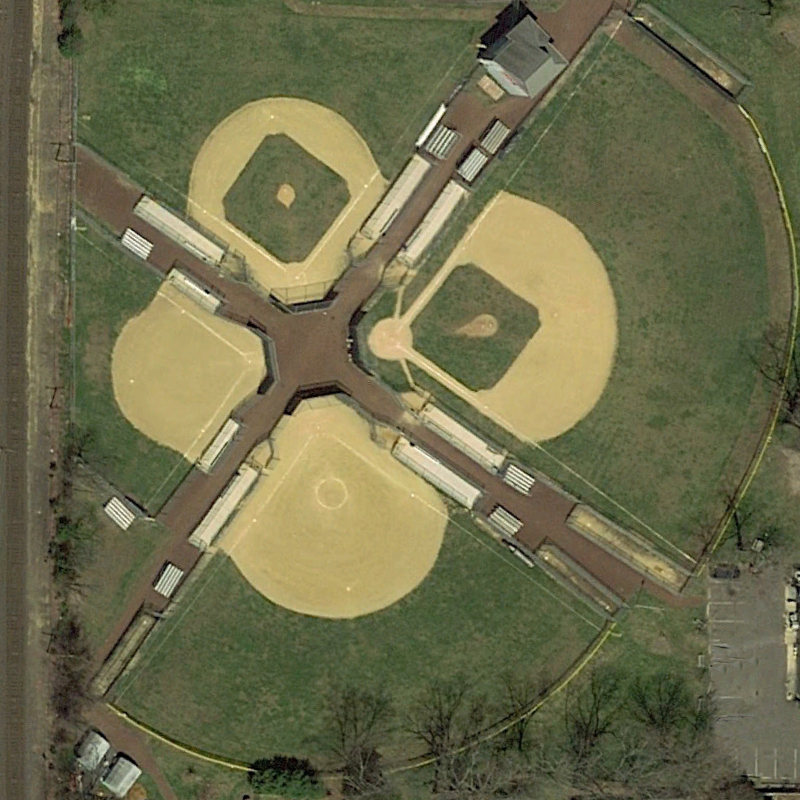

/kaggle/working/GeoChat/demo_images/train_2956_0001.png — size: (600, 600)


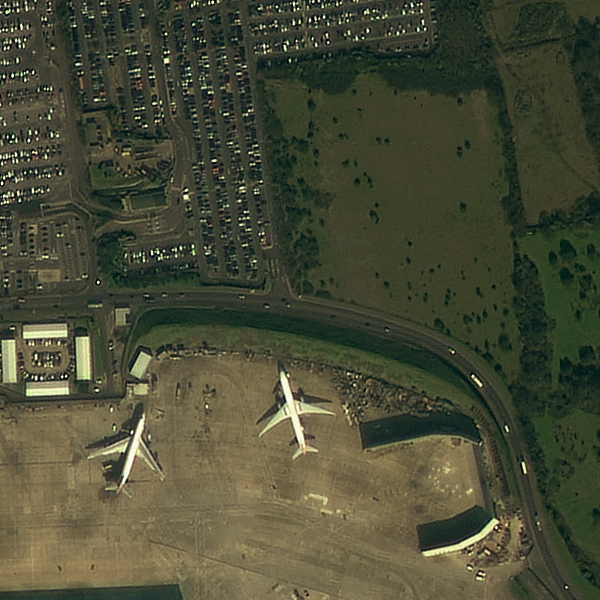

/kaggle/working/GeoChat/images/grounded.jpg — size: (3859, 2369)


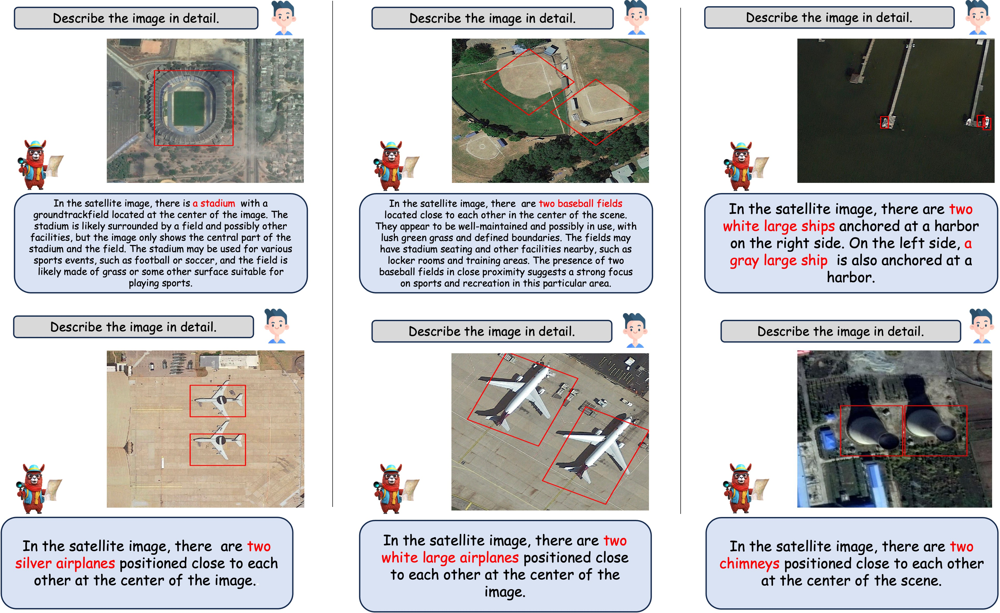

/kaggle/working/GeoChat/images/vqa.jpg — size: (3987, 1512)


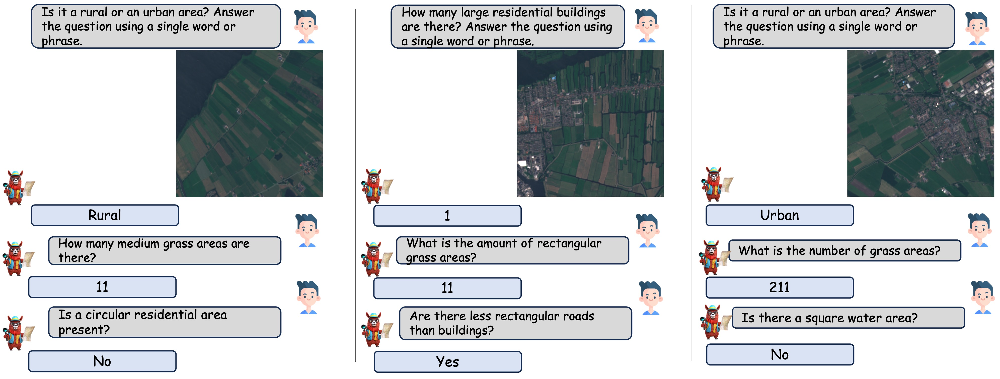

In [42]:
from PIL import Image

candidates = [
    "/kaggle/working/GeoChat/demo_images/04133.png",
    "/kaggle/working/GeoChat/demo_images/train_2956_0001.png",
    "/kaggle/working/GeoChat/images/grounded.jpg",
    "/kaggle/working/GeoChat/images/vqa.jpg",
]

for path in candidates:
    img = Image.open(path)
    print(f"{path} — size: {img.size}")
    display(img)

In [43]:
import shutil
shutil.copy("/kaggle/working/GeoChat/demo_images/04133.png", "/kaggle/working/test_clean_patch.png")
print("Copied — ready to test with: /kaggle/working/test_clean_patch.png")

Copied — ready to test with: /kaggle/working/test_clean_patch.png


In [44]:
result = subprocess.run(
    [
        ENV_PY, "verify_dev1_dev2.py",
        "--image", "/kaggle/working/test_clean_patch.png",
        "--query", "What land cover types and structures are present?",
        "--ground", "[identify] Where are the buildings? Provide bounding boxes.",
        "--real-geochat",
        "--model-path", "MBZUAI/geochat-7B",
    ],
    cwd="/kaggle/working/satquery/backend",
    env=env, capture_output=True, text=True,
)
print("Return code:", result.returncode)
print(result.stdout)
print(result.stderr)

Return code: 0
      SatQuery AI — Dev 1 & Dev 2 Pipeline Verification

[1] Input Image: test_clean_patch.png (1034.0 KB)

--- STEP 1: Dev 1 Compatibility Check ---
  Valid: True
  Format:   raster
  Size:     800 x 800 px
  Bands:    3
  Modality: optical
  CRS:      None (Benchmark image / Unprojected)
  Note:     Image 1 (test_clean_patch.png): Benchmark image · no CRS

--- STEP 2: Dev 1 Preprocessing Pipeline ---
  Preprocessed Size:  (800, 800)
  Color Mode:         RGB
  Cloud Cover Est:    1.7%
  Saved preprocessed preview to: output_dev1_preprocessed.png

--- STEP 3: Dev 2 GeoChat Model Loading ---
  Attempting to load real GeoChat weights from: MBZUAI/geochat-7B
[2026-09-15 14:35:55,583] [INFO] [real_accelerator.py:110:get_accelerator] Setting ds_accelerator to cuda (auto detect)
Loading GeoChat......

--- STEP 4: Dev 2 VQA (Visual Question Answering) ---
  Question: 'What land cover types and structures are present?'
  Answer:   The land cover types present in the image are b